### Feedback control working ###

In [2]:
import numpy as np
import scipy.sparse as sp
import matplotlib.pyplot as plt
from numpy.linalg import norm
from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objects as go

Modeling the system using the reservoir.

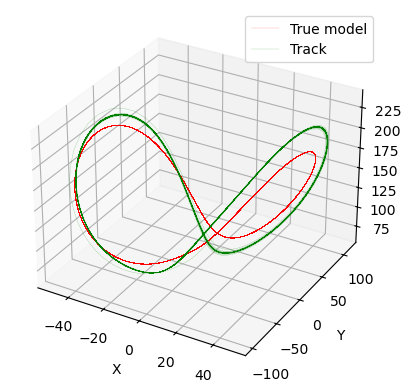

In [3]:
## Lorenz system parameters 
sigma = 10
rho = 140
beta = 6

## Reservoir parameters
n = 1000                    # reservoir size
m = 3                       # number of dimensions in the system  
mu = 1.2                    # Spectral radius of reservoir adjacency matrix
lam = 0.000001              # Lambda for ridge regression

## Simulation parameters
T = 100
dt = 0.002
ntraining = int(T / dt)
trainingtimes = np.linspace(0, T, ntraining + 1)

## Generate random sparse reservoir adjacency matrix A
A1 = sp.random(n, n, density=6/n, format='csr')    # n x n sparse matrix with values between   
A1 = A1 - 0.5 * np.sign(A1.toarray())              # All non-zero terms are shifted left by 0.5
A1 = A1 * mu / np.abs(sp.linalg.eigs(A1, k=1)[0])  # normalize reservoir matrix 
A = sp.csr_matrix(A1)

## Generate random Win matrix to have entries with values between -0.01 to 0.01
Win = 0.01 * (2.0 * np.random.rand(n, m) - 1)

## Generate random intial state for reservoir with values between -0.5 to 0.5
r = 0.5 - 1.0 * np.random.rand(n)

## Inital state of Lorenz system, reservoir states and forcing function
x, y, z = -7.45, -3.03, 0.01
R = np.zeros((n, ntraining))
f = np.zeros((m, ntraining))

### Training ###

## Collecting reservoir time-series data
for t in range(ntraining):

    u = np.array([x, y, z])
    R[:, t] = r
    

    xp = sigma * (y - x)
    yp = x * (rho - z) - y 
    zp = x * y - beta * z

    x += dt * xp
    y += dt * yp
    z += dt * zp

    r = np.tanh(A.dot(r) + Win.dot(u) + 1)
    f[:, t] = np.array([x, y, z])

## Finding Wout matrix using ridge regression
Wout = f.dot(R.T).dot(np.linalg.inv(R.dot(R.T) + lam * np.eye(n)))


### Testing ###

Ttest = 200
ntest = int(Ttest / dt)
testingtimes = np.linspace(0, Ttest, ntest + 1)

xpure = np.zeros(ntest)
ypure = np.zeros(ntest)
zpure = np.zeros(ntest)

xtrack = np.zeros(ntest)             
ytrack = np.zeros(ntest)
ztrack = np.zeros(ntest)

xxpure, yypure, zzpure = x, y, z

for t in range(ntest):
        
    ## No disturbance and system is evolving with old parameters

    xxpurep = sigma * (yypure - xxpure)
    yypurep = xxpure * (rho - zzpure) - yypure
    zzpurep = xxpure * yypure - beta * zzpure

    xxpure += dt * xxpurep
    yypure += dt * yypurep
    zzpure += dt * zzpurep

    xpure[t] = xxpure
    ypure[t] = yypure
    zpure[t] = zzpure 

    ## Tracking

    xtrack[t], ytrack[t], ztrack[t] = Wout.dot(r)
    r = np.tanh(A.dot(r) + Win.dot(np.array([xtrack[t], ytrack[t], ztrack[t]])) + 1) 
    
    


plt.figure()
ax = plt.axes(projection = '3d')
ax.plot3D(xpure, ypure, zpure, 'r', linewidth = 0.1, label = 'True model')
ax.plot3D(xtrack, ytrack, ztrack, 'g', linewidth = 0.1, label = 'Track')
plt.legend()
plt.xlabel('X')
plt.ylabel('Y')
plt.show()

# Create an interactive 3D plot using Plotly
fig = go.Figure()

fig.add_trace(
    go.Scatter3d(
        x = xpure,
        y = ypure,
        z = zpure,
        mode ='lines',
        line = dict(color = 'red', width = 1),
        name = "True model"
    )
)

fig.add_trace(
    go.Scatter3d(
        x = xtrack,
        y = ytrack,
        z = ztrack,
        mode = 'lines',
        line = dict(color = 'green', width = 1),
        name = "Track"
    )
)

fig.update_layout(
    title=f"Lorenz System (σ={sigma:.2f}, ρ={rho:.2f}, β={beta:.2f}, Δt={dt})",
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z',
    ),
    margin=dict(l=0, r=0, b=0, t=40),
)

fig.show()

    

Using reservoir as model to predict the system. This acts as the model for feedback control.

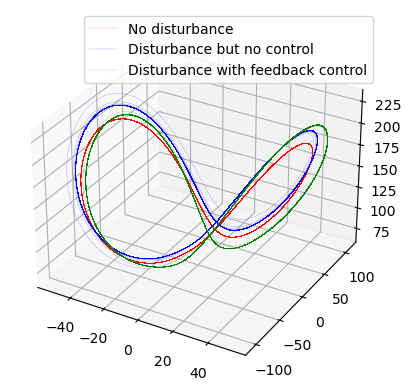

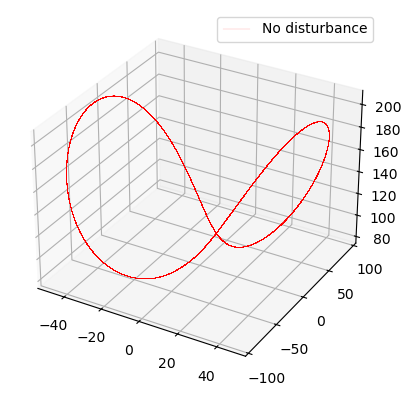

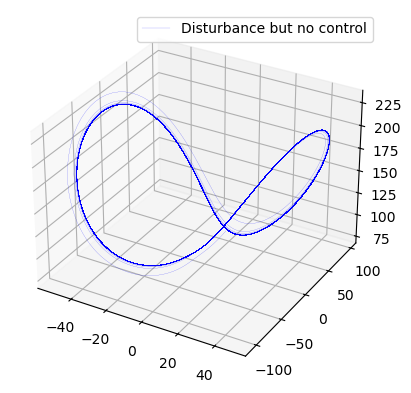

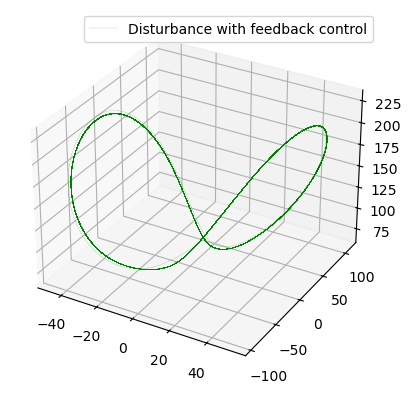

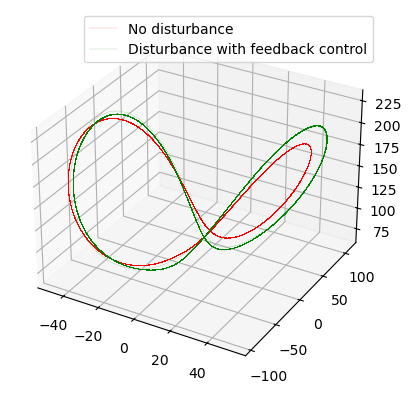

In [ ]:
## Lorenz system parameters 
sigma = 10
rho = 130
beta = 6

## Reservoir parameters
n = 1000                    # reservoir size
m = 3                       # number of dimensions in the system  
mu = 1.2                    # Spectral radius of reservoir adjacency matrix
lam = 0.000001              # Lambda for ridge regression

## Simulation parameters
T = 100
dt = 0.002
ntraining = int(T / dt)
trainingtimes = np.linspace(0, T, ntraining + 1)
controlgain = 1.5

## Generate random sparse reservoir adjacency matrix A
A1 = sp.random(n, n, density=6/n, format='csr')    # n x n sparse matrix with values between   
A1 = A1 - 0.5 * np.sign(A1.toarray())              # All non-zero terms are shifted left by 0.5
A1 = A1 * mu / np.abs(sp.linalg.eigs(A1, k=1)[0])  # normalize reservoir matrix 
A = sp.csr_matrix(A1)

## Generate random Win matrix to have entries with values between -0.01 to 0.01
Win = 0.01 * (2.0 * np.random.rand(n, m) - 1)

## Generate random intial state for reservoir with values between -0.5 to 0.5
r = 0.5 - 1.0 * np.random.rand(n)

## Inital state of Lorenz system, reservoir states and forcing function
x, y, z = -7.45, -3.03, 0.01
R = np.zeros((n, ntraining))
f = np.zeros((m, ntraining))

### Training reservoir to forecast ###

## Collecting reservoir time-series data
for t in range(ntraining):

    u = np.array([x, y, z])
    R[:, t] = r
    

    xp = sigma * (y - x)
    yp = x * (rho - z) - y 
    zp = x * y - beta * z

    x += dt * xp
    y += dt * yp
    z += dt * zp

    r = np.tanh(A.dot(r) + Win.dot(u) + 1)
    f[:, t] = np.array([x, y, z])

## Finding Wout matrix using ridge regression
Wout = f.dot(R.T).dot(np.linalg.inv(R.dot(R.T) + lam * np.eye(n)))


### Testing ###

Ttest = 200
ntest = int(Ttest / dt)
testingtimes = np.linspace(0, Ttest, ntest + 1)


xpure = np.zeros(ntest)
ypure = np.zeros(ntest)
zpure = np.zeros(ntest)

xcontrol = np.zeros(ntest)
ycontrol = np.zeros(ntest)
zcontrol = np.zeros(ntest)

xnocontrol = np.zeros(ntest)
ynocontrol = np.zeros(ntest)
znocontrol = np.zeros(ntest)

xxpure, yypure, zzpure = x, y, z
xxtrack, yytrack, zztrack = x, y, z
xxnocontrol, yynocontrol, zznocontrol = x, y, z
xxcontrol, yycontrol, zzcontrol = x, y, z

for t in range(ntest):
        
    ## No disturbance and system is evolving with old parameters (Ideal trajectory)

    xxpurep = sigma * (yypure - xxpure)
    yypurep = xxpure * (rho - zzpure) - yypure
    zzpurep = xxpure * yypure - beta * zzpure

    xxpure += dt * xxpurep
    yypure += dt * yypurep
    zzpure += dt * zzpurep

    xpure[t] = xxpure
    ypure[t] = yypure
    zpure[t] = zzpure 

    ## With disturbance (Real trajectory with no control)

    xxnocontrolp = sigma * (yynocontrol - xxnocontrol)
    yynocontrolp = xxnocontrol * (rho - zznocontrol) - yynocontrol + 10 * xxnocontrol
    zznocontrolp = xxnocontrol * yynocontrol - beta * zznocontrol
    
    xxnocontrol += dt * xxnocontrolp
    yynocontrol += dt * yynocontrolp
    zznocontrol += dt * zznocontrolp

    xnocontrol[t] = xxnocontrol
    ynocontrol[t] = yynocontrol
    znocontrol[t] = zznocontrol


    ## With disturbance and feedback control

    # Tracking

    xtrack, ytrack, ztrack = Wout.dot(r)
    r = np.tanh(A.dot(r) + Win.dot(np.array([xtrack, ytrack, ztrack])) + 1)


    xxcontrolp = sigma * (yycontrol - xxcontrol) 
    yycontrolp = xxcontrol * (rho - zzcontrol) - yycontrol + 20 * xxcontrol
    zzcontrolp = xxcontrol * yycontrol - beta * zzcontrol
    
    xxcontrol += dt * xxcontrolp + controlgain * (xtrack - xxcontrol)
    yycontrol += dt * yycontrolp + controlgain * (ytrack - yycontrol)
    zzcontrol += dt * zzcontrolp + controlgain * (ztrack - zzcontrol)

    xcontrol[t] = xxcontrol
    ycontrol[t] = yycontrol
    zcontrol[t] = zzcontrol


        
         


plt.figure()
ax = plt.axes(projection = '3d')
ax.plot3D(xpure, ypure, zpure, 'r', linewidth = 0.1, label = 'No disturbance')
ax.plot3D(xnocontrol, ynocontrol, znocontrol, 'b', linewidth = 0.1, label = 'Disturbance but no control')
ax.plot3D(xcontrol, ycontrol, zcontrol, 'g', linewidth = 0.1, label = 'Disturbance with feedback control')
plt.legend()
plt.show()

plt.figure()
ax = plt.axes(projection = '3d')
ax.plot3D(xpure, ypure, zpure, 'r', linewidth = 0.1, label = 'No disturbance')
plt.legend()
plt.show()

plt.figure()
ax = plt.axes(projection = '3d')
ax.plot3D(xnocontrol, ynocontrol, znocontrol, 'b', linewidth = 0.1, label = 'Disturbance but no control')
plt.legend()
plt.show()

plt.figure()
ax = plt.axes(projection = '3d')
ax.plot3D(xcontrol, ycontrol, zcontrol, 'g', linewidth = 0.1, label = 'Disturbance with feedback control')
plt.legend()
plt.show()

plt.figure()
ax = plt.axes(projection = '3d')
ax.plot3D(xpure, ypure, zpure, 'r', linewidth = 0.1, label = 'No disturbance')
ax.plot3D(xcontrol, ycontrol, zcontrol, 'g', linewidth = 0.1, label = 'Disturbance with feedback control')
plt.legend()
plt.show()

    

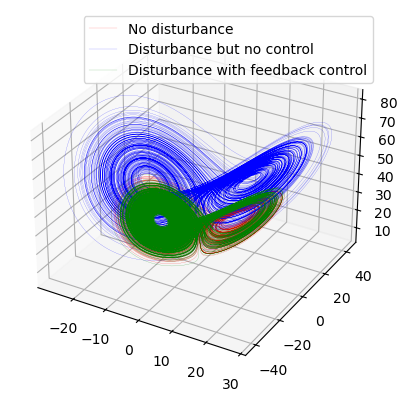

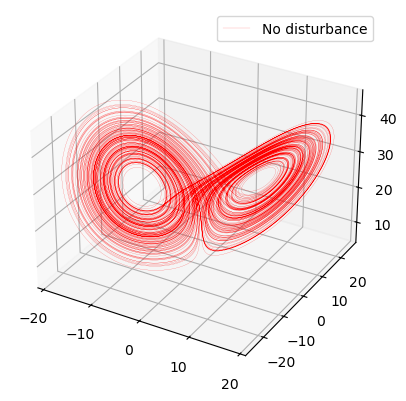

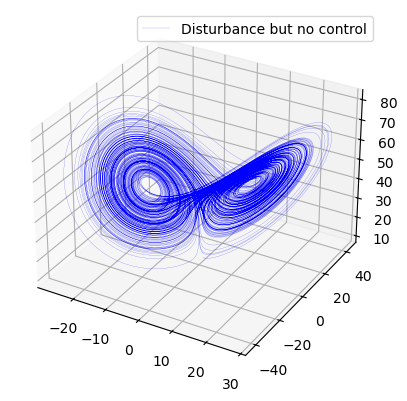

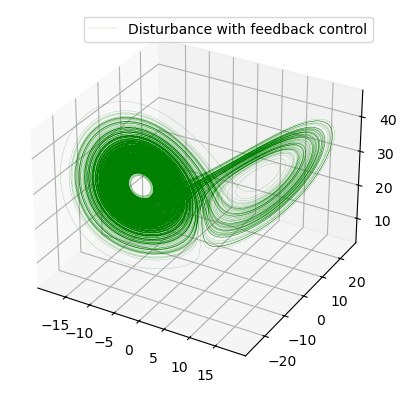

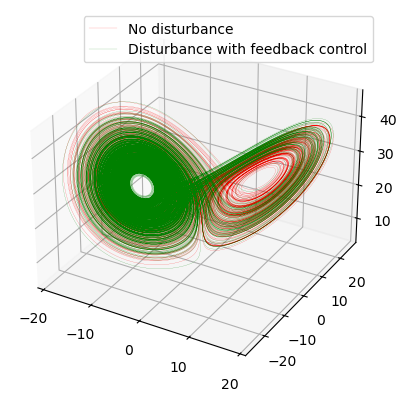

In [17]:
## Lorenz system parameters 
sigma = 10
rho = 28
beta = 2.667

## Reservoir parameters
n = 1000                    # reservoir size
m = 3                       # number of dimensions in the system  
mu = 1.2                    # Spectral radius of reservoir adjacency matrix
lam = 0.000001              # Lambda for ridge regression

## Simulation parameters
T = 100
dt = 0.002
ntraining = int(T / dt)
trainingtimes = np.linspace(0, T, ntraining + 1)
controlgain = 1

## Generate random sparse reservoir adjacency matrix A
A1 = sp.random(n, n, density=6/n, format='csr')    # n x n sparse matrix with values between   
A1 = A1 - 0.5 * np.sign(A1.toarray())              # All non-zero terms are shifted left by 0.5
A1 = A1 * mu / np.abs(sp.linalg.eigs(A1, k=1)[0])  # normalize reservoir matrix 
A = sp.csr_matrix(A1)

## Generate random Win matrix to have entries with values between -0.01 to 0.01
Win = 0.01 * (2.0 * np.random.rand(n, m) - 1)

## Generate random intial state for reservoir with values between -0.5 to 0.5
r = 0.5 - 1.0 * np.random.rand(n)

## Inital state of Lorenz system, reservoir states and forcing function
x, y, z = -7.45, -3.03, 0.01
R = np.zeros((n, ntraining))
f = np.zeros((m, ntraining))

### Training reservoir to forecast ###

## Collecting reservoir time-series data
for t in range(ntraining):

    u = np.array([x, y, z])
    R[:, t] = r
    

    xp = sigma * (y - x)
    yp = x * (rho - z) - y 
    zp = x * y - beta * z

    x += dt * xp
    y += dt * yp
    z += dt * zp

    r = np.tanh(A.dot(r) + Win.dot(u) + 1)
    f[:, t] = np.array([x, y, z])

## Finding Wout matrix using ridge regression
Wout = f.dot(R.T).dot(np.linalg.inv(R.dot(R.T) + lam * np.eye(n)))


### Testing ###

Ttest = 200
ntest = int(Ttest / dt)
testingtimes = np.linspace(0, Ttest, ntest + 1)


xpure = np.zeros(ntest)
ypure = np.zeros(ntest)
zpure = np.zeros(ntest)

xcontrol = np.zeros(ntest)
ycontrol = np.zeros(ntest)
zcontrol = np.zeros(ntest)

xnocontrol = np.zeros(ntest)
ynocontrol = np.zeros(ntest)
znocontrol = np.zeros(ntest)

xxpure, yypure, zzpure = x, y, z
xxtrack, yytrack, zztrack = x, y, z
xxnocontrol, yynocontrol, zznocontrol = x, y, z
xxcontrol, yycontrol, zzcontrol = x, y, z

for t in range(ntest):
        
    ## No disturbance and system is evolving with old parameters (Ideal trajectory)

    xxpurep = sigma * (yypure - xxpure)
    yypurep = xxpure * (rho - zzpure) - yypure
    zzpurep = xxpure * yypure - beta * zzpure

    xxpure += dt * xxpurep
    yypure += dt * yypurep
    zzpure += dt * zzpurep

    xpure[t] = xxpure
    ypure[t] = yypure
    zpure[t] = zzpure 

    ## With disturbance (Real trajectory with no control)

    xxnocontrolp = sigma * (yynocontrol - xxnocontrol)
    yynocontrolp = xxnocontrol * (rho - zznocontrol) - yynocontrol + 20 * xxnocontrol
    zznocontrolp = xxnocontrol * yynocontrol - beta * zznocontrol
    
    xxnocontrol += dt * xxnocontrolp
    yynocontrol += dt * yynocontrolp
    zznocontrol += dt * zznocontrolp

    xnocontrol[t] = xxnocontrol
    ynocontrol[t] = yynocontrol
    znocontrol[t] = zznocontrol


    ## With disturbance and feedback control

    # Tracking

    xtrack, ytrack, ztrack = Wout.dot(r)
    r = np.tanh(A.dot(r) + Win.dot(np.array([xtrack, ytrack, ztrack])) + 1)


    xxcontrolp = sigma * (yycontrol - xxcontrol) 
    yycontrolp = xxcontrol * (rho - zzcontrol) - yycontrol + 20 * xxcontrol
    zzcontrolp = xxcontrol * yycontrol - beta * zzcontrol
    
    xxcontrol += dt * xxcontrolp + controlgain * (xtrack - xxcontrol)
    yycontrol += dt * yycontrolp + controlgain * (ytrack - yycontrol)
    zzcontrol += dt * zzcontrolp + controlgain * (ztrack - zzcontrol)

    xcontrol[t] = xxcontrol
    ycontrol[t] = yycontrol
    zcontrol[t] = zzcontrol


        
         


plt.figure()
ax = plt.axes(projection = '3d')
ax.plot3D(xpure, ypure, zpure, 'r', linewidth = 0.1, label = 'No disturbance')
ax.plot3D(xnocontrol, ynocontrol, znocontrol, 'b', linewidth = 0.1, label = 'Disturbance but no control')
ax.plot3D(xcontrol, ycontrol, zcontrol, 'g', linewidth = 0.1, label = 'Disturbance with feedback control')
plt.legend()
plt.show()

plt.figure()
ax = plt.axes(projection = '3d')
ax.plot3D(xpure, ypure, zpure, 'r', linewidth = 0.1, label = 'No disturbance')
plt.legend()
plt.show()

plt.figure()
ax = plt.axes(projection = '3d')
ax.plot3D(xnocontrol, ynocontrol, znocontrol, 'b', linewidth = 0.1, label = 'Disturbance but no control')
plt.legend()
plt.show()

plt.figure()
ax = plt.axes(projection = '3d')
ax.plot3D(xcontrol, ycontrol, zcontrol, 'g', linewidth = 0.1, label = 'Disturbance with feedback control')
plt.legend()
plt.show()

plt.figure()
ax = plt.axes(projection = '3d')
ax.plot3D(xpure, ypure, zpure, 'r', linewidth = 0.1, label = 'No disturbance')
ax.plot3D(xcontrol, ycontrol, zcontrol, 'g', linewidth = 0.1, label = 'Disturbance with feedback control')
plt.legend()
plt.show()

    